In [53]:
import skimage
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
from scipy.optimize import curve_fit

# Sign extraction

In [54]:
def preprocess(fname, threshold = 0.85, sign_color = [1.1467, 51.18945, 135.2949]):
    img = skimage.io.imread(fname)
    gray = 1 - (np.linalg.norm(img - sign_color, axis = 2) / (255*np.sqrt(3)))
    rot = skimage.transform.rotate(gray, 180)
    binary = rot > threshold
    labels = skimage.measure.label(binary)

    max_area = 1000
    centroid = None
    sign = None

    for region in skimage.measure.regionprops(labels):
        if region.area > max_area:
            max_area = region.area
            (min_row, min_col, max_row, max_col) = region.bbox
            sign = rot[min_row:max_row, min_col:max_col]
            centroid = region.centroid
    
    return max_area, centroid, sign

## Preprocess for training

In [3]:
signs = []
for i in range(55):
    area, centroid, sign = preprocess(f"data/right/{i}.jpg")
    signs.append(sign)

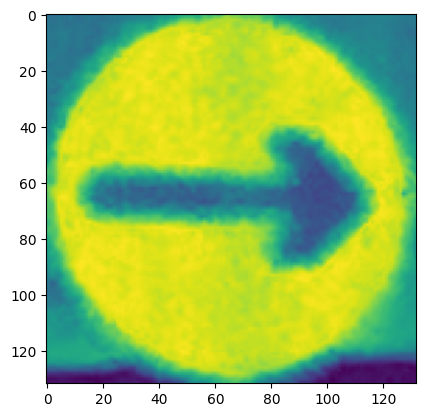

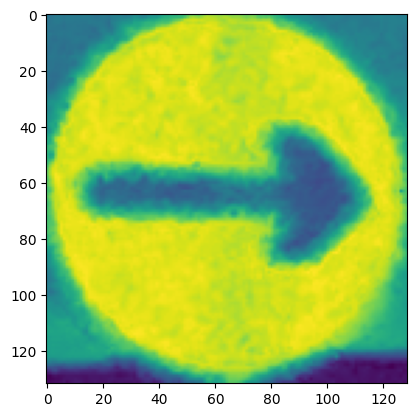

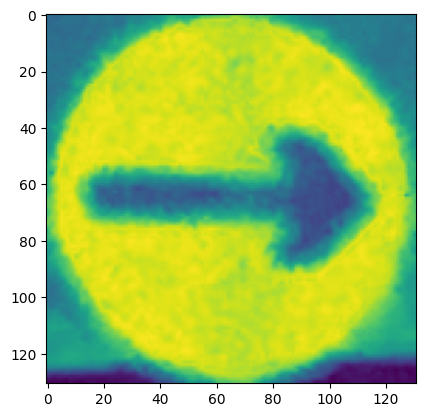

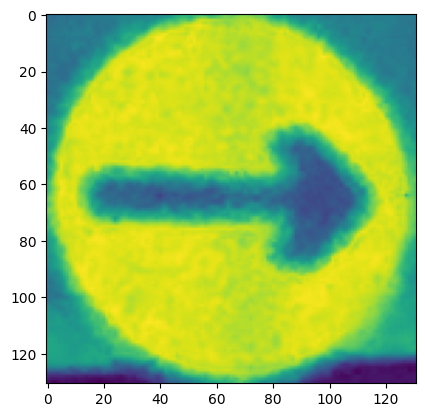

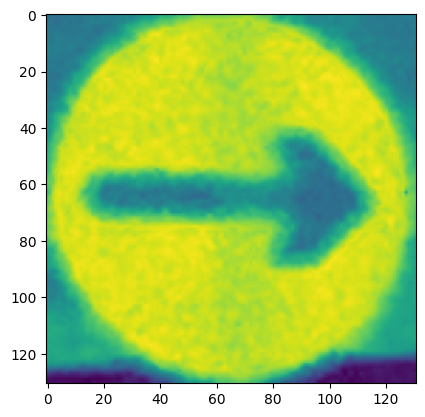

...

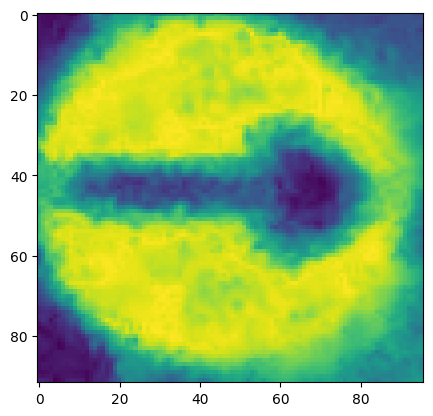

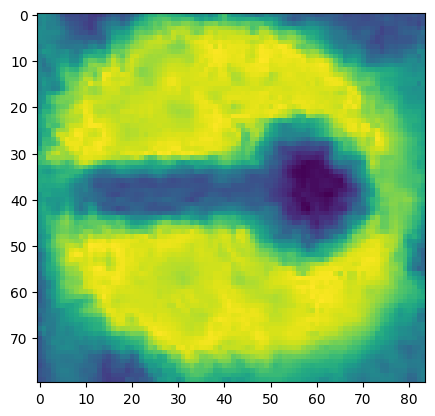

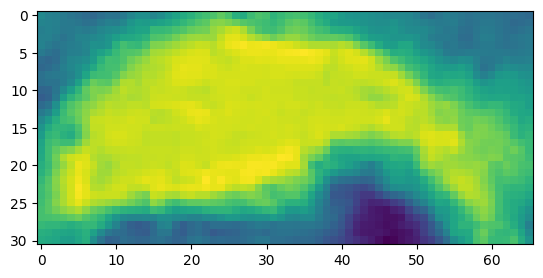

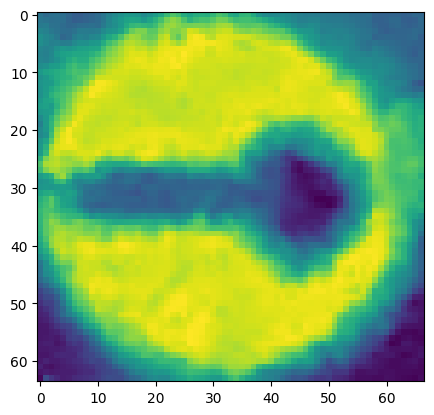

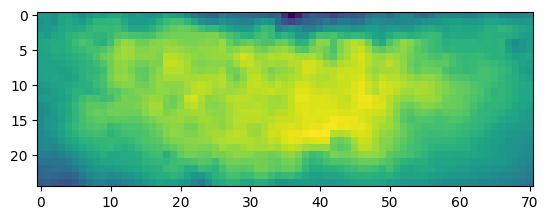

In [4]:
i = 0
for sign in signs:
    if sign is not None:
        plt.imshow(sign)
        plt.show()
        skimage.io.imsave(f"data/right_cropped/{i}.png", (255 * sign).astype("uint8"))
        i += 1

## Determine if found spot is a sign or not

In [110]:
fnames = os.listdir("data/is_sign/raw")
for fname in fnames:
    area, centroid, sign = preprocess(f'data/is_sign/raw/{fname}')
    basename = fname.split('.')[0]
    if sign is not None:
        skimage.io.imsave(f"data/is_sign/cropped/{basename}.png", (255 * sign).astype("uint8"))


## Orientation

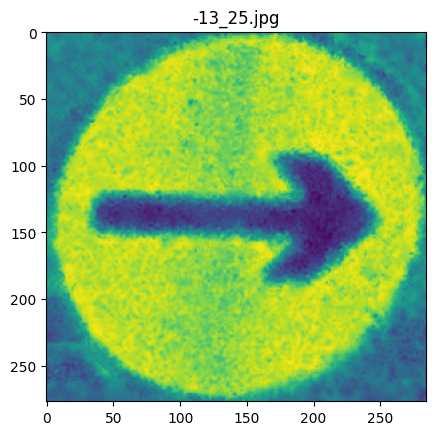

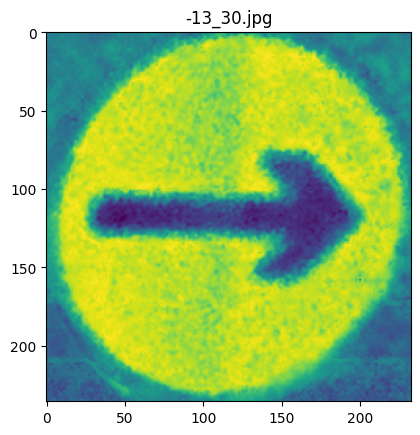

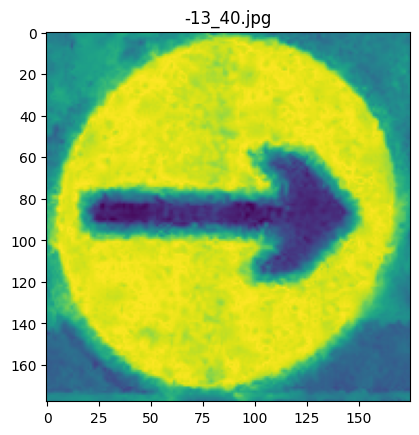

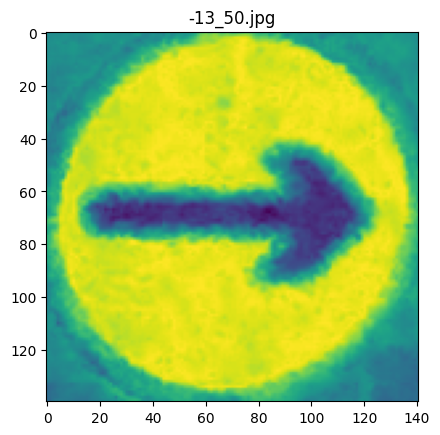

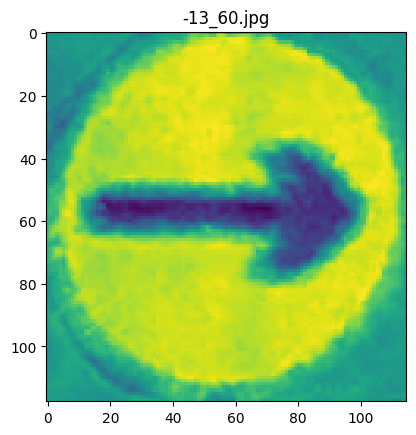

...

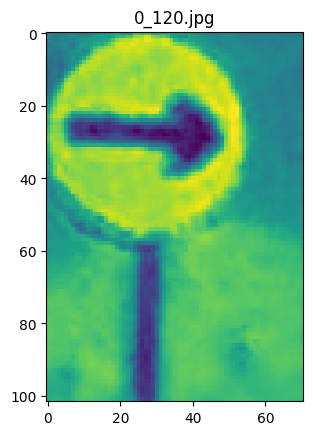

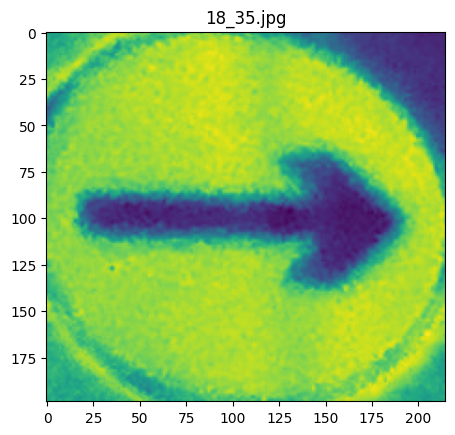

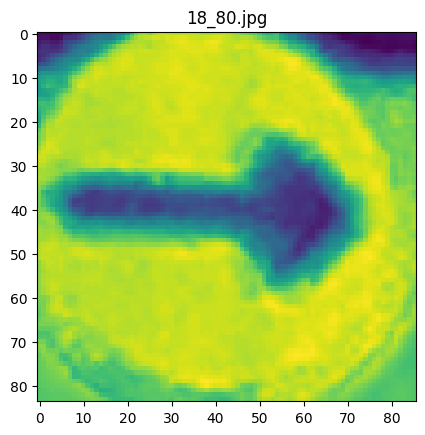

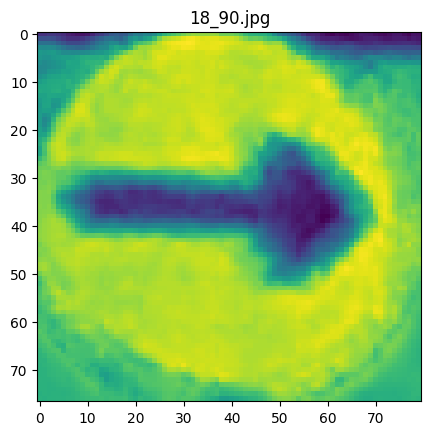

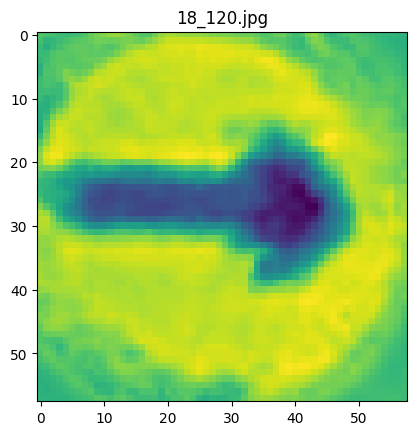

In [99]:
correction = 10 # Account for the camera being on the front of the device
tmp = []
fnames = os.listdir("data/orientation")
for fname in fnames:
    stripped = fname.split(".")[0].strip()
    offset, distance = list(map(float, stripped.split("_")))
    angle = np.atan(offset/distance)
    angle_corrected = np.atan(offset/(distance + correction))
    r = np.sqrt(offset**2 + distance**2)
    r_corrected = np.sqrt(offset**2 + (distance + correction)**2)
    area, centroid, sign = preprocess(f"data/orientation/{fname}")
    if sign is not None and centroid is not None and area is not None and "disabled" not in fname:
        tmp.append({
            "angle": angle,
            "angle_c": angle_corrected,
            "r": r,
            "r_c": r_corrected,
            "x": centroid[1],
            "y": centroid[0],
            "width": sign.shape[1],
            "height": sign.shape[0]
        })
        plt.imshow(sign)
        plt.title(fname)
        plt.show()

or_data = pd.DataFrame.from_dict(tmp)

In [104]:
or_data

,angle,angle_c,r,r_c,x,y,width,height
0,-0.479519,-0.355636,28.178006,37.336309,2866.922150,738.418990,285,277
1,-0.408908,-0.314232,32.695565,42.059482,2653.839639,743.308197,233,236
2,-0.314232,-0.254368,42.059482,51.662365,2406.835532,748.323998,175,178
3,-0.254368,-0.213369,51.662365,61.392182,2249.206068,752.303950,141,140
4,-0.213369,-0.183622,61.392182,71.196910,2141.725906,755.093245,115,118
5,-0.183622,-0.161092,71.196910,81.049368,2061.601545,756.168334,98,98
6,-0.161092,-0.143452,81.049368,90.934042,2002.309325,758.465061,85,85
7,0.000000,0.000000,5.000000,15.000000,1552.628518,896.972532,1089,1099
8,0.000000,0.000000,10.000000,20.000000,1536.354704,866.853997,606,615
9,0.000000,0.000000,20.000000,30.000000,1530.260521,849.741528,320,324


### Calculate angle

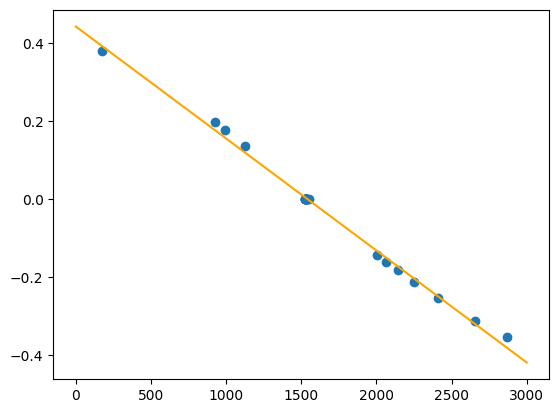

array([-2.87824117e-04,  4.43471415e-01])

In [100]:
def linearModel(x, a, b):
    return a*x + b
res, _ = curve_fit(linearModel, or_data.x, or_data.angle_c)
plt.scatter(or_data.x, or_data.angle_c)
xs = np.linspace(0, 3000, 10)
plt.plot(xs, linearModel(xs, *res), color="orange")
plt.show()
res

In [101]:
def getAngle(centroid):
    x = centroid[1]
    # Magic numbers (obtained with regression)
    a = -2.87824117e-04
    b =  4.43471415e-01

    return a*x + b

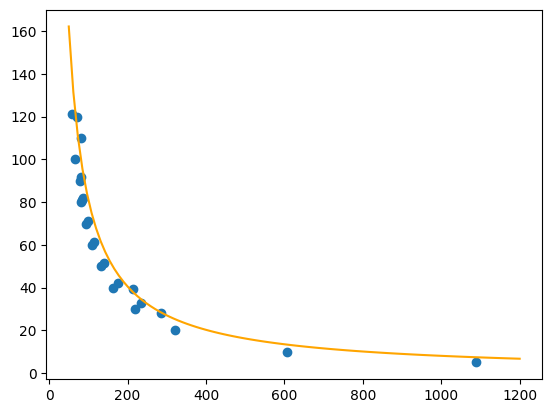

array([8108.02942543])

In [102]:
def reciprocalModel(x, A):
    return A/(x)
res, _ = curve_fit(reciprocalModel, or_data.width, or_data.r_c)
plt.scatter(or_data.width, or_data.r)
xs = np.linspace(50, 1200, 100)
plt.plot(xs, reciprocalModel(xs, *res), color="orange")
plt.show()
res

In [103]:
def getDistance(bbox):
    width = bbox[3] - bbox[1]

    # Magic number (obtained with regression)
    a = 8108.02942543

    # Reasonable output range
    lower = 5.0
    upper = 200

    res = a/x

    if res < lower:
        return lower
    elif res > upper:
        return upper
    else:
        return res